# imports

In [1]:
from SEAM.utils import *
import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
Using TensorFlow backend.


# settings

In [2]:
sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
cls_cmp = palettable.cartocolors.qualitative.Bold_10.mpl_colors

# load

### load raw and segmented data from data/process/

In [6]:
a = sc.read_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/raw/mouse_liver_revision_raw.h5ad')

In [8]:
a_2 = sc.read_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/raw/mouse_lung_raw.h5ad')


In [18]:
a_raw = a.copy()

In [21]:
a_2

AnnData object with n_obs × n_vars = 540 × 164 
    uns: 'IMS', 'cell_idx', 'cell_pos', 'train_x'

In [22]:
a_raw.uns['IMS'] = a.uns['IMS_new']
a_raw.uns['cell_idx'] = a.uns['cell_idx']
a_raw.uns['cell_pos'] = a.uns['cell_pos']
a_raw.uns['train_x'] = a.uns['train_x']

In [25]:
a_raw.write_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/raw/mouse_liver_rep_raw.h5ad')

In [29]:
a = SEAM.datasets.load_dataset_raw('Rev1_Sto2_gaussian_auto')

In [31]:
a.write_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/raw/mouse_stomach_raw.h5ad')


In [32]:
a

AnnData object with n_obs × n_vars = 460 × 316 
    uns: 'cell_idx', 'cell_pos', 'IMS', 'train_x'

In [3]:
data_list = [
    'Rev1_Sto2_gaussian_auto',
    
    'Rev1_Pan6_gaussian_auto',
    'Rev1_Pan6_gaussian_ada',
    
    'Rev1_Pan4_gaussian_auto',
    'Rev1_Pan4_gaussian_ada',
    
    'Rev1_Lung3_gaussian_auto',
    
    'Rev1_Lung1_gaussian_auto',
    'Rev1_Lung1_gaussian_ada',
    
    'Rev1_Kidney2_None_auto',
    'Rev1_Kidney2_None_ada',
    'Rev1_Kidney2_gaussian_auto',
    
    'Rev1_Kidney1_None_auto',
    'Rev1_Kidney1_None_ada',
    'Rev1_Kidney1_gaussian_auto'
    
]

In [4]:
a = SEAM.datasets.load_dataset_raw(data_list[0])

In [5]:
var_names_float = np.array(a.var_names).astype('float')
a = a[:,var_names_float>=50]
a.uns['IMS'] = a.uns['IMS'][:,var_names_float>=50]

Trying to set attribute `.uns` of view, copying.


### display raw ion image data

256 256


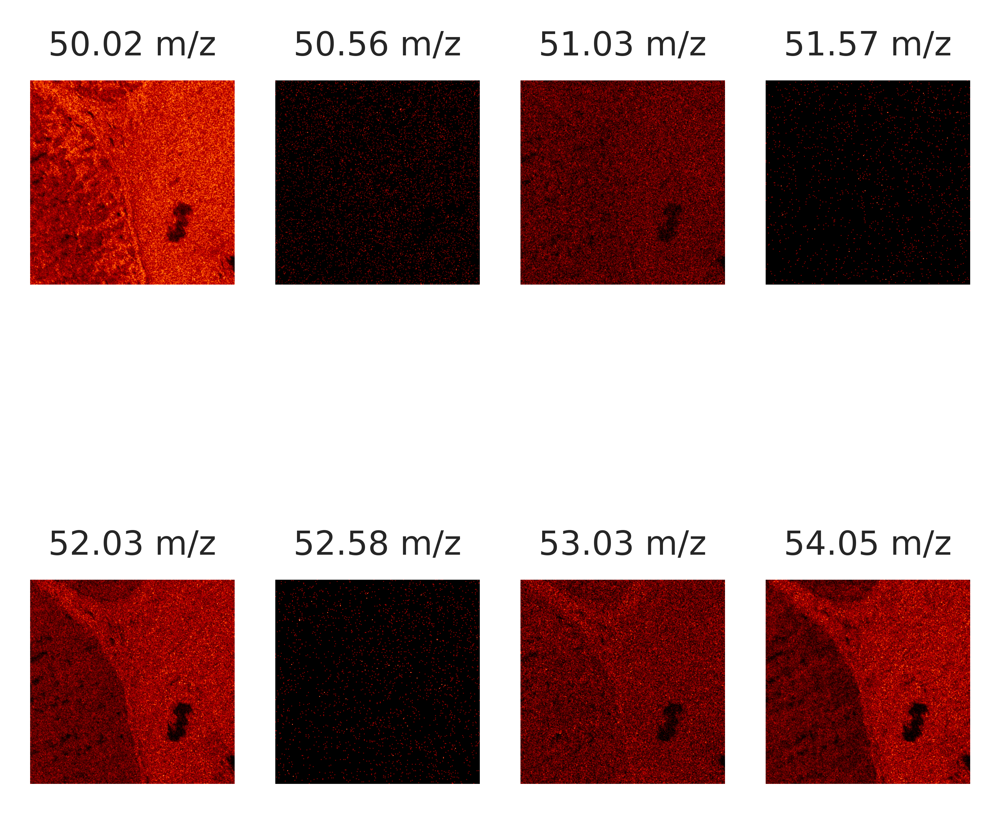

In [6]:
SEAM.pl.IMS(a,list(a.var_names[:8]),n_cols=4)

In [8]:
a.uns['adenine'] = '134.08'

# View

### run SIMS-View with DR_method=Umap

In [30]:
a = SEAM.tl.View(a,method='Umap')

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/e

### show result of SIMS-View

In [31]:
SEAM.pl.View(a,method='Umap')

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 579 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


In [9]:
for i in range(10):
    
    a = SEAM.tl.View(a,method='Umap',bg_threshold=10-i)
    SEAM.pl.View(a,method='Umap')

(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/e

(65536, 3) (31606,) (31606, 3)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 12 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (37103,) (37103, 3)


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (43038,) (43038, 3)


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (48927,) (48927, 3)


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (54322,) (54322, 3)


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (58678,) (58678, 3)


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (61861,) (61861, 3)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 23703 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (63772,) (63772, 3)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3016 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (64835,) (64835, 3)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 8948 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


(65536,)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


(65536, 3) (65301,) (65301, 3)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 12221 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


# Cut

### get segmented mask and cell position, and write into anndata

In [7]:
a=SEAM.tl.Cut(a)

setting obsm: spatial


## each cell represented as a dot

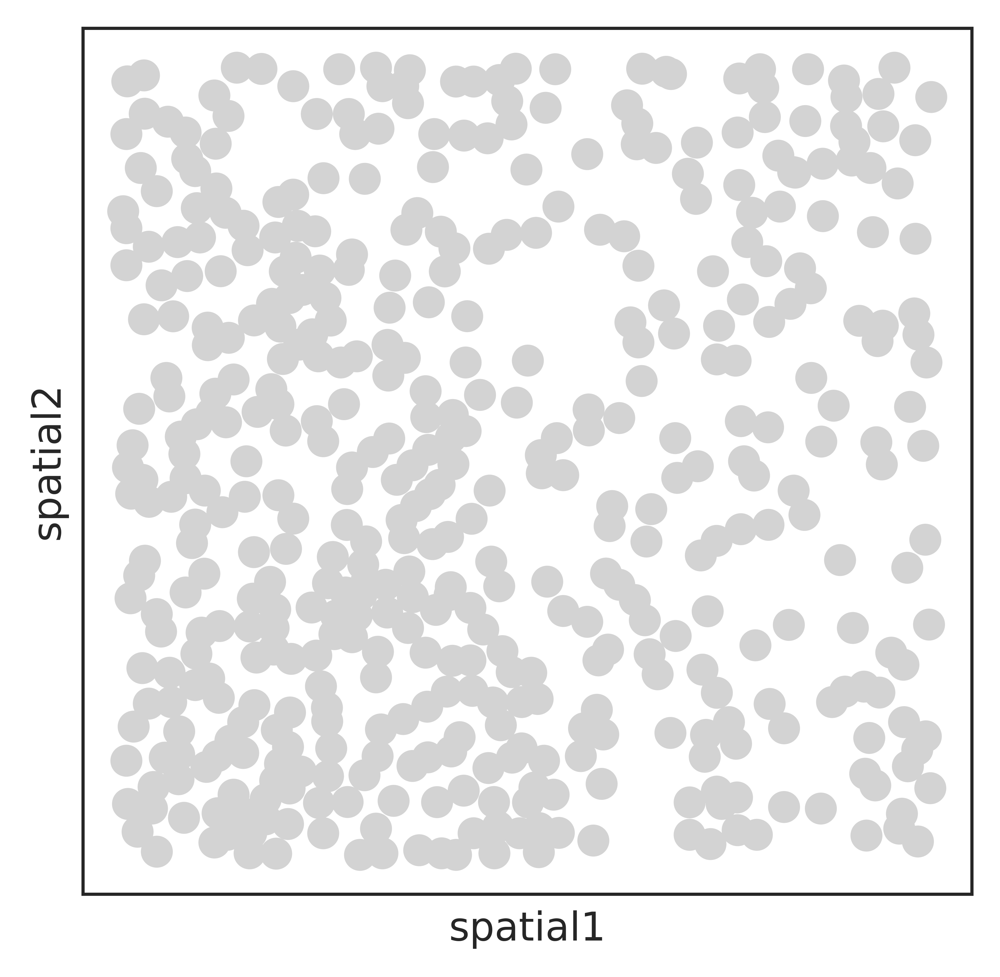

In [8]:
SEAM.pl.Cut(a,method='dot',save=None)

## each cell represented as a segmented mask

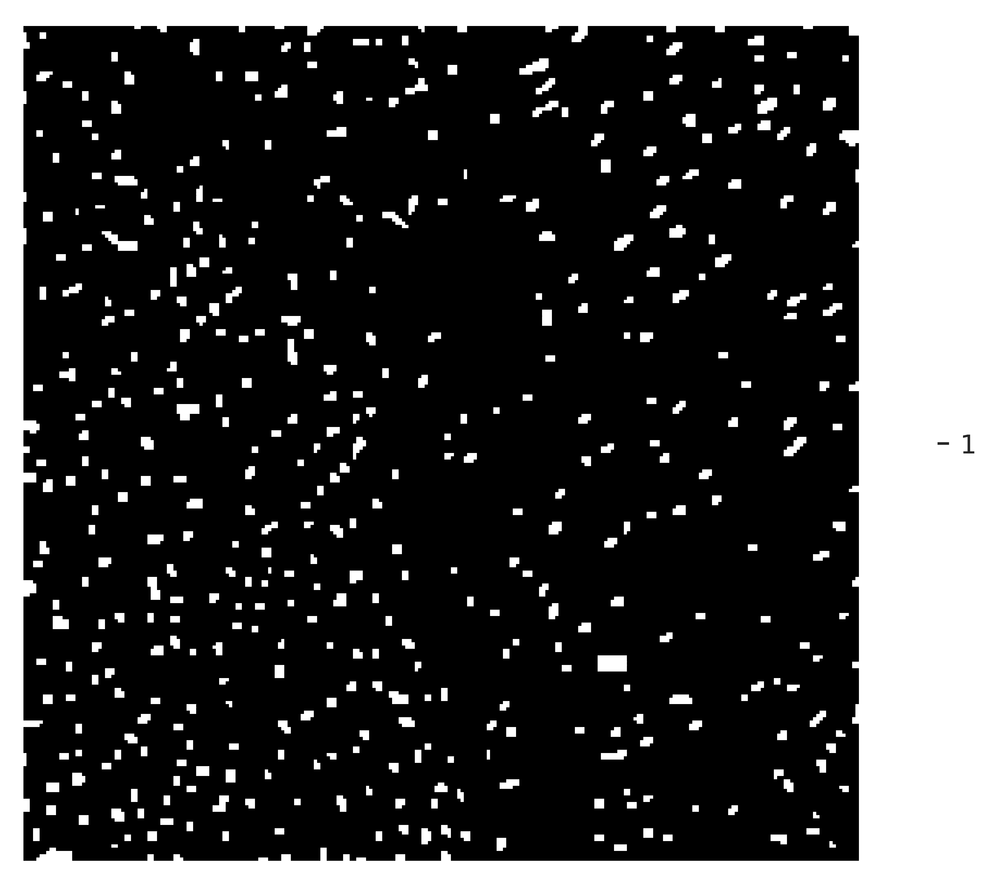

In [9]:
SEAM.pl.Cut(a,method='mask',save=None)

# ID&Cluster

### run SIMS-ID with epochs and temperature.

In [10]:
SEAM.tl.ID(a,epochs=200,t=5,subsample=False,verbose=True)

running SIMS-ID...


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/200
3788/3788 [==============================] - 1s 262us/step - loss: 6.1215 - softmax_loss: 6.1202 - center_loss: 0.3141
Epoch 2/200
3788/3788 [==============================] - 0s 96us/step - loss: 6.0140 - softmax_loss: 6.0135 - center_loss: 4.3329
Epoch 3/200
3788/3788 [==============================] - 0s 104us/step - loss: 5.6343 - softmax_loss: 5.6345 - center_loss: 11.2501
Epoch 4/200
3788/3788 [==============================] - 0s 98us/step - loss: 5.3887 - softmax_loss: 5.3887 - center_loss: 30.5605
Epoch 5/200
3788/3788 [==============================] - 0s 106us/step - loss: 5.2899 - softmax_loss: 5.2902 - center_loss: 50.2720
Epoch 6/200
3788/3788 [==============================] - 0s 99us/step - loss: 5.2104 - softmax_loss: 5.2124 - center_loss: 77.6671
Epoch 7/200
3788/3788 [==============================] - 0s 108us/step - loss: 5.1402 - softmax_loss: 5.1430 - center_loss: 104.7104
Epoch 8/200
3788/3788 [==============================] - 0s 92us/step - loss: 5.

### dump intermediate results

In [12]:
a.write_h5ad('../../data/demo_dump/ID.h5ad')

### run Cluster methods with cell representation method of SIMS-ID

In [26]:
a = SEAM.tl.Cluster(a,method='SIMLR',cluster_param=3,rep='ID')

(460, 3788) 3
SIMLR highly recommends you to perform PCA first on the data

Please use the in-line function fast_pca on your input



/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:70: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(d)
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:75: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  u = AnnoyIndex(d)


Successfully Run SIMLR! SIMLR took 0.597633 seconds in total

done!


### umap embedding with cell representation method of SIMS-ID

In [27]:
a = SEAM.tl.Umap(a,rep='ID')

computing neighbors
    finished (0:00:00)
computing UMAP
    finished (0:00:00)
Sucessfully run Umap!


### Umap embedding colored coded by SIMLR result

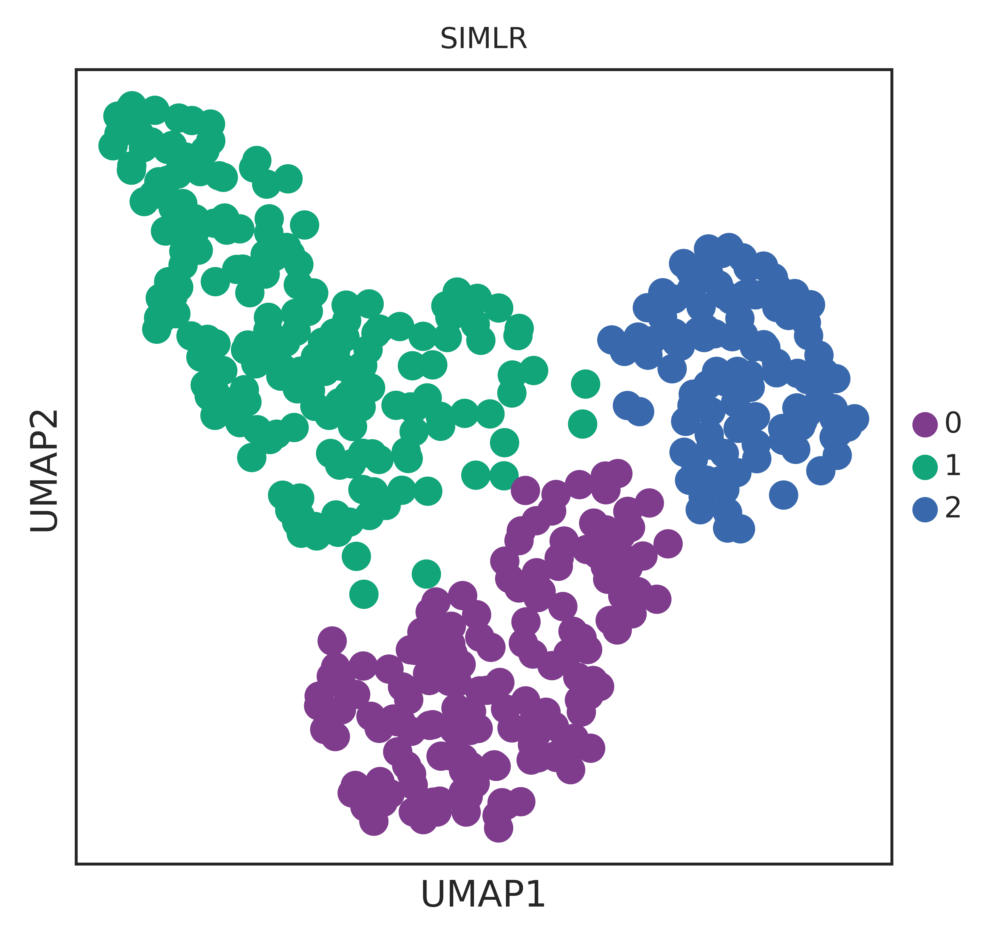

In [28]:
SEAM.pl.ID(a)

### spatial single cell map colored by SIMLR

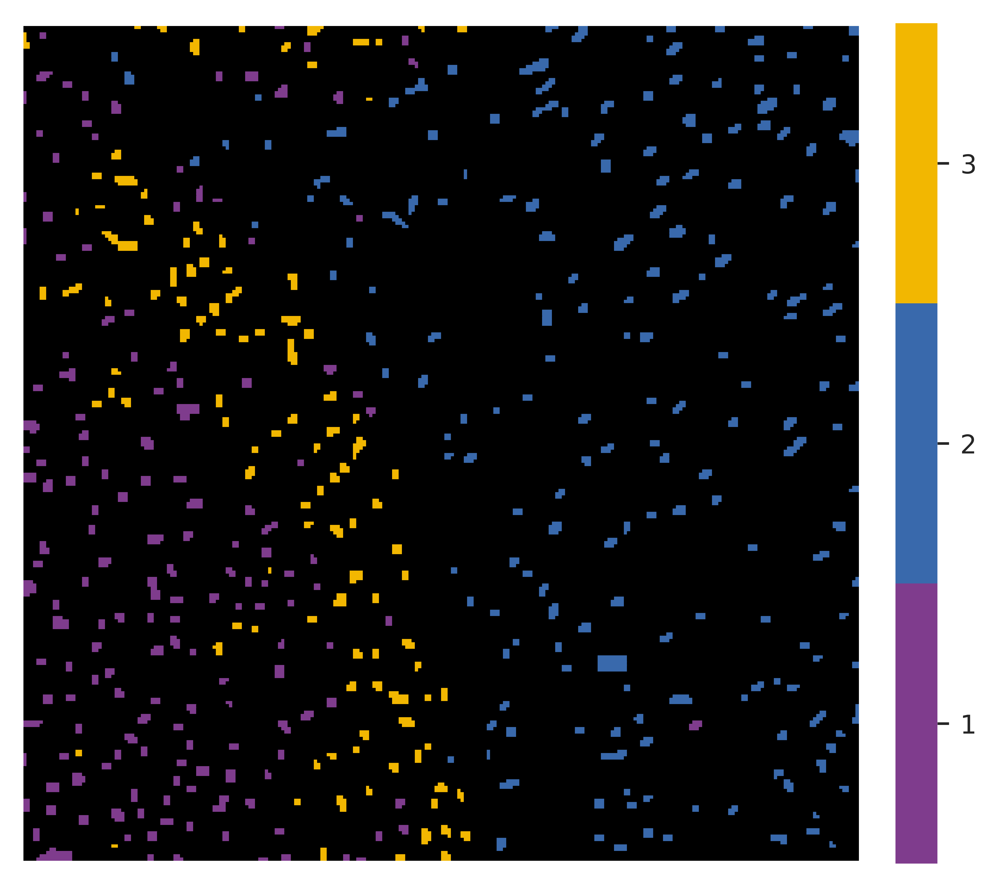

In [29]:
SEAM.pl.Cluster(a,cls='SIMLR',groups=range(4),method='mask')